In [ ]:
# IMPORTS
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import numpy as np

# PRIMERO HACEMOS EL EDA

## PASO 1: Planteamiento del problema

- Objetivo: Descubrir si existe alguna relación entre los recursos sanitarios y los datos socio demográficos. 

- SE IMPORTA EL CONJUNTO DE DATOS PARA EMPEZAR A TRABAJAR CON ÉL. 

In [2]:
# CARGAR EL DATASET

total_data = pd.read_csv("https://raw.githubusercontent.com/4GeeksAcademy/regularized-linear-regression-project-tutorial/main/demographic_health_data.csv")

total_data.head()

NameError: name 'pd' is not defined

## PASO 2: Exploración y Lipieza de Datos

In [ ]:
# CONOCER LAS DIMENSIONES DEL DATASET 
total_data.shape

(3140, 108)

In [ ]:
# OBTENER INFORMACIÓN SOBRE LOS TIPOS DE DATOS Y VALORES NO NULOS
total_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3140 entries, 0 to 3139
Columns: 108 entries, fips to Urban_rural_code
dtypes: float64(61), int64(45), object(2)
memory usage: 2.6+ MB


In [ ]:
total_data.describe()

,fips,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,COPD_number,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code
count,3140.000000,3.140000e+03,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,...,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000
mean,30401.640764,1.041894e+05,1.274030e+04,11.871051,1.336798e+04,12.694609,1.446933e+04,12.283979,1.391649e+04,11.751535,...,5827.242357,13.073503,12.088089,14.053726,9326.577707,3.446242,3.207516,3.710478,2466.234076,4.635350
std,15150.559265,3.335834e+05,4.180730e+04,2.124081,4.228439e+04,1.815044,4.957773e+04,3.126297,4.899095e+04,1.696599,...,15720.551934,2.724351,2.622948,2.824828,29754.601185,0.568059,0.527740,0.613069,7730.422067,1.510447
min,1001.000000,8.800000e+01,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,1.100000e+01,6.092789,...,7.000000,6.100000,5.500000,6.700000,11.000000,1.800000,1.700000,1.900000,3.000000,1.000000
25%,18180.500000,1.096325e+04,1.280500e+03,10.594639,1.374500e+03,11.674504,1.263750e+03,10.496774,1.232750e+03,10.689322,...,815.000000,11.200000,10.300000,12.100000,1187.750000,3.100000,2.900000,3.300000,314.750000,3.000000
50%,29178.000000,2.580050e+04,3.057000e+03,11.802727,3.274000e+03,12.687422,3.108000e+03,11.772649,3.000500e+03,11.580861,...,1963.500000,12.800000,11.800000,13.800000,2743.000000,3.400000,3.200000,3.700000,718.000000,5.000000
75%,45081.500000,6.791300e+04,8.097000e+03,12.951840,8.822250e+03,13.659282,8.976250e+03,13.182260,8.314250e+03,12.639379,...,4727.000000,14.800000,13.700000,15.900000,6679.250000,3.800000,3.500000,4.100000,1776.250000,6.000000
max,56045.000000,1.010552e+07,1.208253e+06,25.460677,1.239139e+06,23.304372,1.557073e+06,37.570198,1.501844e+06,22.225129,...,434075.000000,25.600000,24.200000,27.000000,952335.000000,6.200000,5.800000,6.600000,237766.000000,6.000000


Una vez obtenida la información, se extraen las siguientes conclusiones: 

- Existen un total de 3.140 filas y 108 columnas.
- De las columnas 106 son variables continuas y 2 son categóricas.


In [ ]:
print(total_data.isnull().sum())

fips                      0
TOT_POP                   0
0-9                       0
0-9 y/o % of total pop    0
19-Oct                    0
                         ..
CKD_prevalence            0
CKD_Lower 95% CI          0
CKD_Upper 95% CI          0
CKD_number                0
Urban_rural_code          0
Length: 108, dtype: int64


In [ ]:
# null_counts = total_data.isnull().sum()
# null_counts = null_counts[null_counts > 0].sort_values(ascending=False)  # Filtrar y ordenar
# print(null_counts)

- ELIMINAR DUPLICADOS:

In [ ]:
total_data.duplicated().sum()

np.int64(0)

In [ ]:
data_without_duplicates = total_data.drop_duplicates(subset = total_data.columns)

In [ ]:
data_without_duplicates.head()

,fips,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,COPD_number,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code
0,1001,55601,6787,12.206615,7637,13.735364,6878,12.370281,7089,12.749771,...,3644,12.9,11.9,13.8,5462,3.1,2.9,3.3,1326,3
1,1003,218022,24757,11.355276,26913,12.344167,23579,10.814964,25213,11.564429,...,14692,12.0,11.0,13.1,20520,3.2,3.0,3.5,5479,4
2,1005,24881,2732,10.980266,2960,11.896628,3268,13.134520,3201,12.865239,...,2373,19.7,18.6,20.6,3870,4.5,4.2,4.8,887,6
3,1007,22400,2456,10.964286,2596,11.589286,3029,13.522321,3113,13.897321,...,1789,14.1,13.2,14.9,2511,3.3,3.1,3.6,595,2
4,1009,57840,7095,12.266598,7570,13.087828,6742,11.656293,6884,11.901798,...,4661,13.5,12.6,14.5,6017,3.4,3.2,3.7,1507,2


In [ ]:
data_without_duplicates.shape

(3140, 108)

In [ ]:
clean_data = data_without_duplicates.rename(columns={'19-Oct': '10-19'})

- ELIMINAR INFORMACIÓN IRRELEVANTE:

## PASO 3: Análisis de variables univariante

- ANÁLISIS DE VARIABLES CATEGÓRICAS:

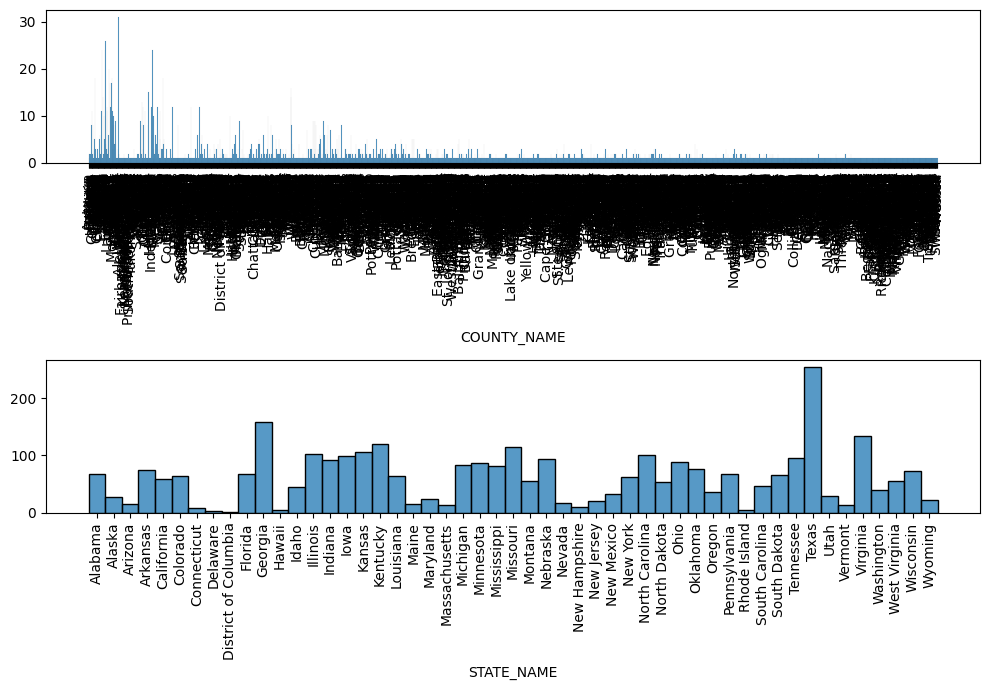

In [ ]:
fig, axis = plt.subplots(2, 1, figsize=(10, 7))

# Histograma en el primer subplot
sns.histplot(ax=axis[0], data=total_data, x="COUNTY_NAME").set(ylabel=None)
# Histograma en el segundo subplot
sns.histplot(ax=axis[1], data=total_data, x="STATE_NAME").set(ylabel=None)

axis[0].tick_params(axis='x', rotation=90)
axis[1].tick_params(axis='x', rotation=90)


# Ajustar el layout
plt.tight_layout()
plt.show()

OBSERVACIONES Y CONCLUSIONES DE LOS GRÁFICOS DEL ANÁLISIS DE VARIABLES CATEGÓRICAS

In [ ]:
data_without_duplicates.describe()

,fips,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,COPD_number,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code
count,3140.000000,3.140000e+03,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,...,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000
mean,30401.640764,1.041894e+05,1.274030e+04,11.871051,1.336798e+04,12.694609,1.446933e+04,12.283979,1.391649e+04,11.751535,...,5827.242357,13.073503,12.088089,14.053726,9326.577707,3.446242,3.207516,3.710478,2466.234076,4.635350
std,15150.559265,3.335834e+05,4.180730e+04,2.124081,4.228439e+04,1.815044,4.957773e+04,3.126297,4.899095e+04,1.696599,...,15720.551934,2.724351,2.622948,2.824828,29754.601185,0.568059,0.527740,0.613069,7730.422067,1.510447
min,1001.000000,8.800000e+01,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,1.100000e+01,6.092789,...,7.000000,6.100000,5.500000,6.700000,11.000000,1.800000,1.700000,1.900000,3.000000,1.000000
25%,18180.500000,1.096325e+04,1.280500e+03,10.594639,1.374500e+03,11.674504,1.263750e+03,10.496774,1.232750e+03,10.689322,...,815.000000,11.200000,10.300000,12.100000,1187.750000,3.100000,2.900000,3.300000,314.750000,3.000000
50%,29178.000000,2.580050e+04,3.057000e+03,11.802727,3.274000e+03,12.687422,3.108000e+03,11.772649,3.000500e+03,11.580861,...,1963.500000,12.800000,11.800000,13.800000,2743.000000,3.400000,3.200000,3.700000,718.000000,5.000000
75%,45081.500000,6.791300e+04,8.097000e+03,12.951840,8.822250e+03,13.659282,8.976250e+03,13.182260,8.314250e+03,12.639379,...,4727.000000,14.800000,13.700000,15.900000,6679.250000,3.800000,3.500000,4.100000,1776.250000,6.000000
max,56045.000000,1.010552e+07,1.208253e+06,25.460677,1.239139e+06,23.304372,1.557073e+06,37.570198,1.501844e+06,22.225129,...,434075.000000,25.600000,24.200000,27.000000,952335.000000,6.200000,5.800000,6.600000,237766.000000,6.000000


In [ ]:
# Renombrar una columna
data = data_without_duplicates.rename(columns={'19-Oct': '10-19'})

data

,fips,TOT_POP,0-9,0-9 y/o % of total pop,10-19,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,COPD_number,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code
0,1001,55601,6787,12.206615,7637,13.735364,6878,12.370281,7089,12.749771,...,3644,12.9,11.9,13.8,5462,3.1,2.9,3.3,1326,3
1,1003,218022,24757,11.355276,26913,12.344167,23579,10.814964,25213,11.564429,...,14692,12.0,11.0,13.1,20520,3.2,3.0,3.5,5479,4
2,1005,24881,2732,10.980266,2960,11.896628,3268,13.134520,3201,12.865239,...,2373,19.7,18.6,20.6,3870,4.5,4.2,4.8,887,6
3,1007,22400,2456,10.964286,2596,11.589286,3029,13.522321,3113,13.897321,...,1789,14.1,13.2,14.9,2511,3.3,3.1,3.6,595,2
4,1009,57840,7095,12.266598,7570,13.087828,6742,11.656293,6884,11.901798,...,4661,13.5,12.6,14.5,6017,3.4,3.2,3.7,1507,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,56037,43051,6104,14.178532,6326,14.694200,5359,12.448027,6577,15.277229,...,2098,8.9,8.3,9.6,2834,2.6,2.4,2.8,821,5
3136,56039,23081,2384,10.328842,2185,9.466661,2967,12.854729,4093,17.733200,...,928,7.2,6.5,8.0,1360,2.4,2.2,2.6,447,5
3137,56041,20299,3121,15.375142,3205,15.788955,2153,10.606434,2702,13.311001,...,1163,10.4,9.5,11.2,1500,3.0,2.8,3.2,430,5
3138,56043,7885,858,10.881420,1113,14.115409,715,9.067850,903,11.452124,...,506,11.3,10.3,12.1,686,3.4,3.2,3.7,207,6


In [ ]:
data_nums = data.select_dtypes(include=['float64', 'int64'])

In [ ]:
nombres_columnas = data_nums.columns.tolist()
nombres_columnas

['fips',
 'TOT_POP',
 '0-9',
 '0-9 y/o % of total pop',
 '10-19',
 '10-19 y/o % of total pop',
 '20-29',
 '20-29 y/o % of total pop',
 '30-39',
 '30-39 y/o % of total pop',
 '40-49',
 '40-49 y/o % of total pop',
 '50-59',
 '50-59 y/o % of total pop',
 '60-69',
 '60-69 y/o % of total pop',
 '70-79',
 '70-79 y/o % of total pop',
 '80+',
 '80+ y/o % of total pop',
 'White-alone pop',
 '% White-alone',
 'Black-alone pop',
 '% Black-alone',
 'Native American/American Indian-alone pop',
 '% NA/AI-alone',
 'Asian-alone pop',
 '% Asian-alone',
 'Hawaiian/Pacific Islander-alone pop',
 '% Hawaiian/PI-alone',
 'Two or more races pop',
 '% Two or more races',
 'POP_ESTIMATE_2018',
 'N_POP_CHG_2018',
 'GQ_ESTIMATES_2018',
 'R_birth_2018',
 'R_death_2018',
 'R_NATURAL_INC_2018',
 'R_INTERNATIONAL_MIG_2018',
 'R_DOMESTIC_MIG_2018',
 'R_NET_MIG_2018',
 'Less than a high school diploma 2014-18',
 'High school diploma only 2014-18',
 "Some college or associate's degree 2014-18",
 "Bachelor's degree or h

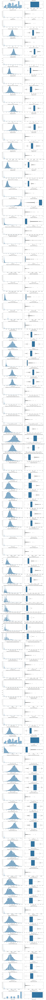

In [ ]:
# Lista de variables numéricas
numerica_vars = nombres_columnas

# Configurar número de filas y columnas (2 gráficos por variable)
n_cols = 2  # Primera columna: Histograma, Segunda columna: Boxplot
n_rows = len(numerica_vars)  # Cada variable ocupa una fila

# Crear la figura y los ejes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3 * n_rows))
axes = axes.reshape(n_rows, n_cols)  # Asegurar que sea una matriz

# Generar histogramas y boxplots
for i, var in enumerate(numerica_vars):
    # Histograma
    sns.histplot(data=data_nums, x=var, ax=axes[i, 0], kde=True)  # kde=True para suavizado
    axes[i, 0].set_ylabel(None)
    axes[i, 0].set_title(f"Histograma de {var}")

    # Boxplot
    sns.boxplot(data=data_nums, x=var, ax=axes[i, 1])
    axes[i, 1].set_ylabel(None)
    axes[i, 1].set_title(f"Boxplot de {var}")

# Ajustar diseño para mejor visualización
plt.tight_layout()
plt.show()

Observaciones y conclusiones

# PASO 4: Análisis de variables multivariantes.

- ANÁLISIS DE VARIABLES CATEGÓRICA-CATEGÓRICA:

Se escoge como target la variable `diabetes_number`.


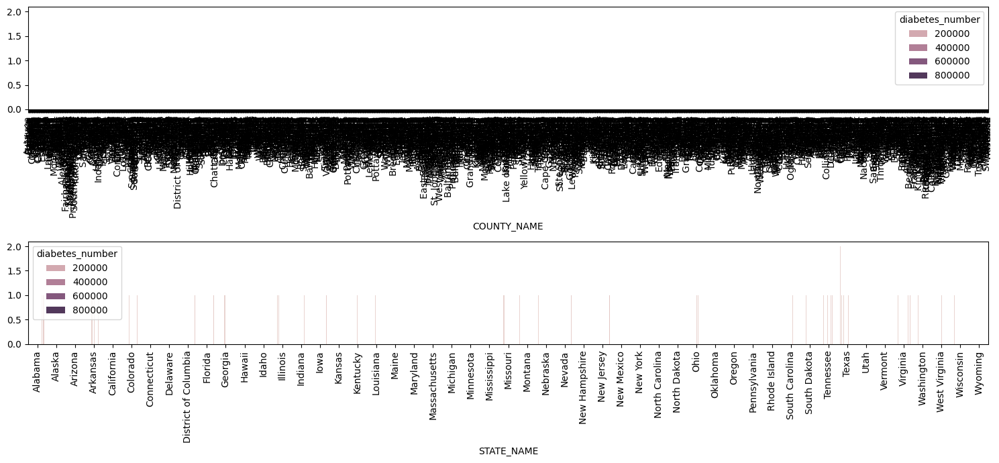

In [ ]:
# Variables categóricas a graficar
categorical_vars = ["COUNTY_NAME", "STATE_NAME"]

# Crear la figura con 2 filas y 3 columnas
fig, axes = plt.subplots(2, 1, figsize=(15, 7))

# Generar gráficos usando un bucle
for ax, var in zip(axes.flat, categorical_vars):
    sns.countplot(ax=ax, data=clean_data, x=var, hue="diabetes_number")
    ax.set_ylabel(None)  # Quitar etiquetas innecesarias
    ax.tick_params(axis="x", rotation=90)  # Rotar etiquetas X

# Ajustar diseño
plt.tight_layout()
plt.show()

In [ ]:
# Definir variables
num_vars = numerica_vars.copy()  # Evitar modificar la lista original
num_vars.remove("diabetes_number")  # Elimina "diabetes_number" de la lista

target = "diabetes_number"

n_cols = 2  # Dos columnas: regplot y heatmap
n_rows = len(num_vars)  # Una fila por cada variable

# Crear la figura
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 4 * n_rows))

# Asegurar que axes sea 2D para indexar correctamente
if n_rows == 1:
    axes = np.expand_dims(axes, axis=0)

# Graficar regplot y heatmap para cada variable
for i, var in enumerate(num_vars):
    # Columna 0: Regplot
    sns.regplot(data=clean_data, x=var, y=target, ax=axes[i, 0])
    axes[i, 0].set_title(f"Regplot: {target} vs {var}")

    # Columna 1: Heatmap de correlación
    corr_matrix = clean_data[[target, var]].corr()  # Matriz de correlación
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", 
                cbar=False, linewidths=0.5, ax=axes[i, 1])
    axes[i, 1].set_title(f"Correlación: {target} vs {var}")

# Ajustar diseño
plt.tight_layout()
plt.show()


C:\Users\mafer\AppData\Local\Temp\ipykernel_22360\378270891.py:30: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


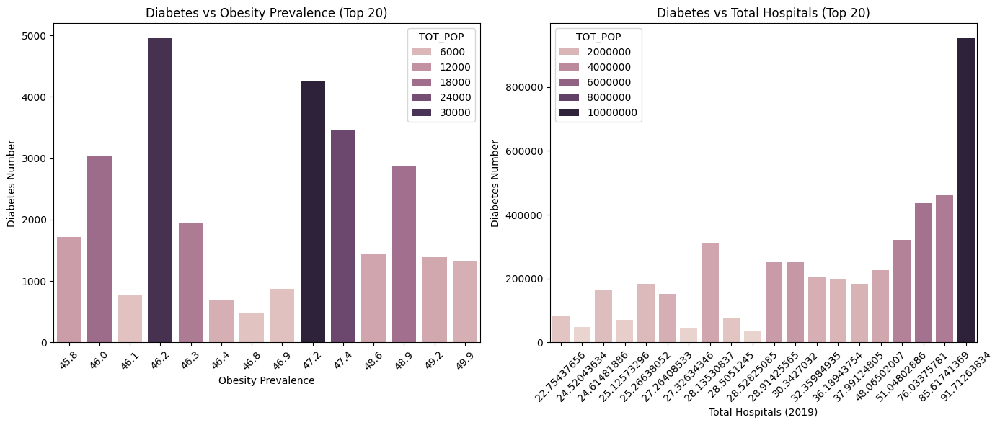

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 🔹 Filtrar Top 20 valores más altos de "Obesity_prevalence"
top_obesity = clean_data.nlargest(20, "Obesity_prevalence")

# 🔹 Filtrar Top 20 valores más altos de "Total Hospitals (2019)"
top_hospitals = clean_data.nlargest(20, "Total Hospitals (2019)")

# 🔹 Crear figura
fig, axes = plt.subplots(figsize=(14, 6), ncols=2)

# 🔹 Gráfico 1: Obesity_prevalence vs diabetes_number
sns.barplot(ax=axes[0], data=top_obesity, x="Obesity_prevalence", y='diabetes_number', 
            hue='TOT_POP', dodge=False)
axes[0].set_title("Diabetes vs Obesity Prevalence (Top 20)")
axes[0].set_ylabel("Diabetes Number")
axes[0].set_xlabel("Obesity Prevalence")
axes[0].tick_params(axis='x', rotation=45)  # Rotar etiquetas

# 🔹 Gráfico 2: Total Hospitals vs diabetes_number
sns.barplot(ax=axes[1], data=top_hospitals, x="Total Hospitals (2019)", y='diabetes_number', 
            hue='TOT_POP', dodge=False)
axes[1].set_title("Diabetes vs Total Hospitals (Top 20)")
axes[1].set_ylabel("Diabetes Number")
axes[1].set_xlabel("Total Hospitals (2019)")
axes[1].tick_params(axis='x', rotation=45)  # Rotar etiquetas

# 🔹 Ajustar diseño
plt.tight_layout()
plt.show()


- ANÁLISIS DE CORRELACIONES:

In [ ]:
# EN EL EDA HACÉIS:

clean_data["COUNTY_NAME_n"] = pd.factorize(clean_data["COUNTY_NAME"])[0]

county_name_transformation_rules = {row["COUNTY_NAME"]: row["COUNTY_NAME_n"] for _, row in clean_data[["COUNTY_NAME", "COUNTY_NAME_n"]].drop_duplicates().iterrows()}

with open("county_name_transformation_rules.json", "w") as f:
  json.dump(county_name_transformation_rules, f)

clean_data["STATE_NAME_n"] = pd.factorize(clean_data["STATE_NAME"])[0]

state_name_transformation_rules = {row["STATE_NAME"]: row["STATE_NAME_n"] for _, row in clean_data[["STATE_NAME", "STATE_NAME_n"]].drop_duplicates().iterrows()}

with open("state_name_transformation_rules.json", "w") as f:
  json.dump(state_name_transformation_rules, f)

In [ ]:
clean_data

,fips,TOT_POP,0-9,0-9 y/o % of total pop,10-19,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code,COUNTY_NAME_n,STATE_NAME_n
0,1001,55601,6787,12.206615,7637,13.735364,6878,12.370281,7089,12.749771,...,11.9,13.8,5462,3.1,2.9,3.3,1326,3,0,0
1,1003,218022,24757,11.355276,26913,12.344167,23579,10.814964,25213,11.564429,...,11.0,13.1,20520,3.2,3.0,3.5,5479,4,1,0
2,1005,24881,2732,10.980266,2960,11.896628,3268,13.134520,3201,12.865239,...,18.6,20.6,3870,4.5,4.2,4.8,887,6,2,0
3,1007,22400,2456,10.964286,2596,11.589286,3029,13.522321,3113,13.897321,...,13.2,14.9,2511,3.3,3.1,3.6,595,2,3,0
4,1009,57840,7095,12.266598,7570,13.087828,6742,11.656293,6884,11.901798,...,12.6,14.5,6017,3.4,3.2,3.7,1507,2,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,56037,43051,6104,14.178532,6326,14.694200,5359,12.448027,6577,15.277229,...,8.3,9.6,2834,2.6,2.4,2.8,821,5,1837,50
3136,56039,23081,2384,10.328842,2185,9.466661,2967,12.854729,4093,17.733200,...,6.5,8.0,1360,2.4,2.2,2.6,447,5,481,50
3137,56041,20299,3121,15.375142,3205,15.788955,2153,10.606434,2702,13.311001,...,9.5,11.2,1500,3.0,2.8,3.2,430,5,1838,50
3138,56043,7885,858,10.881420,1113,14.115409,715,9.067850,903,11.452124,...,10.3,12.1,686,3.4,3.2,3.7,207,6,1839,50


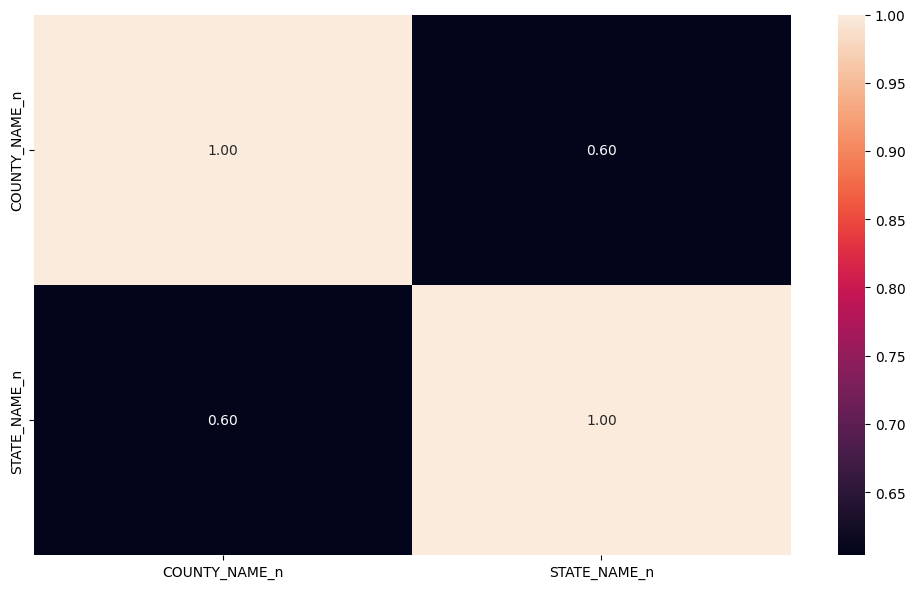

In [ ]:
fig, axis = plt.subplots(figsize = (10, 6))

sns.heatmap(clean_data[["COUNTY_NAME_n", "STATE_NAME_n"]].corr(), annot = True, fmt = ".2f")

plt.tight_layout()

plt.show()

- ANÁLISIS NUMÉRICO- CATEGÓRICO COMPLETO:

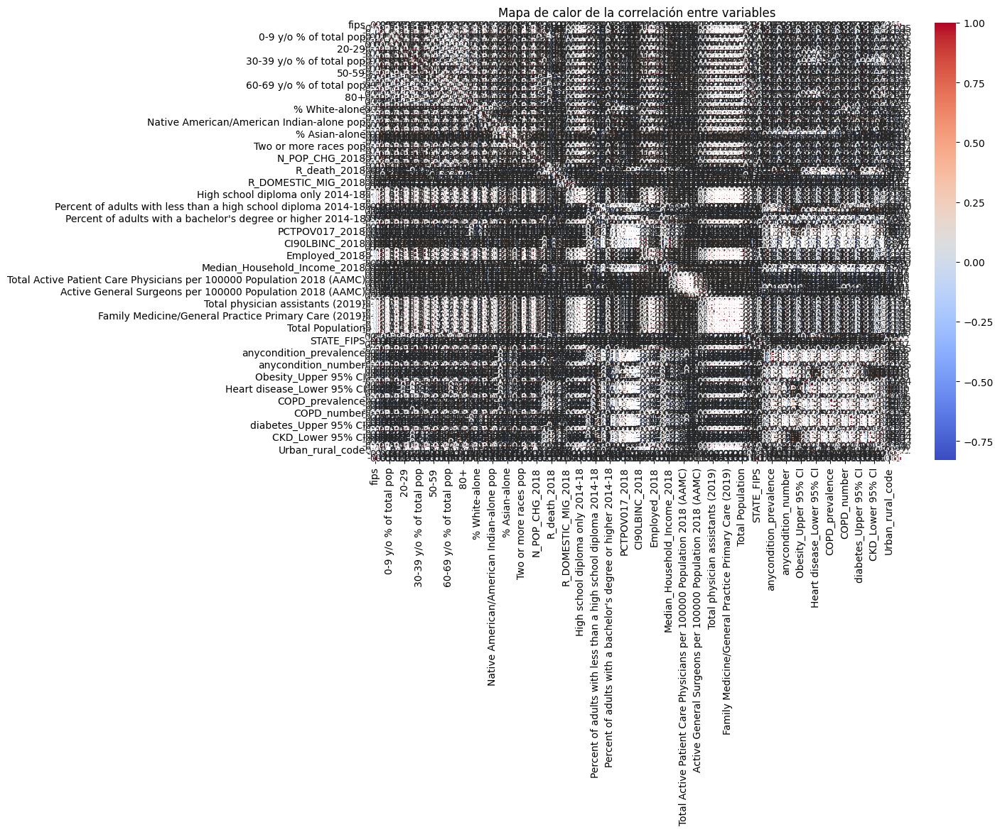

In [ ]:
# 🔹 Asegurar que solo incluimos variables numéricas
numeric_data = clean_data.select_dtypes(include=['number'])

# 🔹 Calcular la matriz de correlación
corr_matrix = numeric_data.corr()

# 🔹 Crear el heatmap
plt.figure(figsize=(12, 8))  # Ajustar tamaño
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)

# 🔹 Agregar título
plt.title("Mapa de calor de la correlación entre variables")

# 🔹 Mostrar gráfico
plt.show()

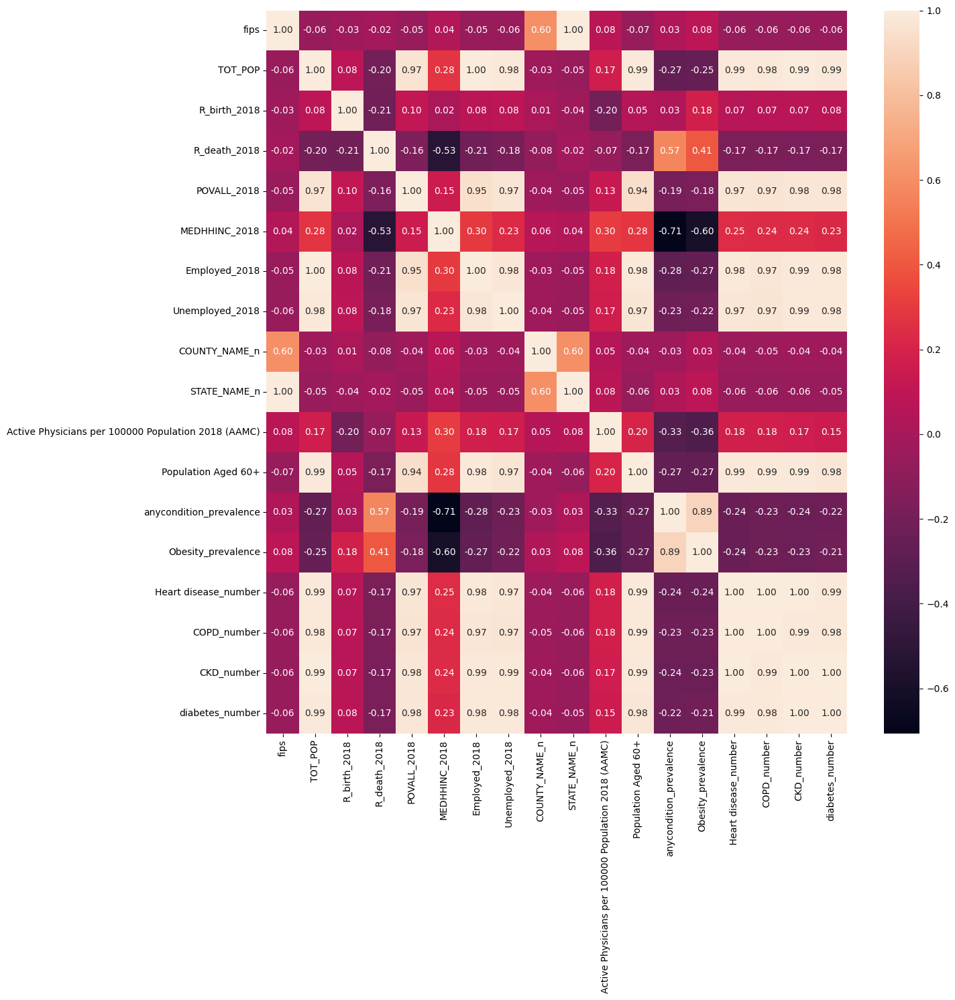

In [ ]:
fig, axis = plt.subplots(figsize = (15, 15))

sns.heatmap(clean_data[["fips", "TOT_POP", "R_birth_2018", "R_death_2018", "POVALL_2018", "MEDHHINC_2018", "Employed_2018", "Unemployed_2018", "COUNTY_NAME_n", "STATE_NAME_n", "Active Physicians per 100000 Population 2018 (AAMC)", "Population Aged 60+", "anycondition_prevalence", "Obesity_prevalence", "Heart disease_number", "COPD_number", "CKD_number", "diabetes_number"]].corr(), annot = True, fmt = ".2f")

plt.tight_layout()

plt.show()

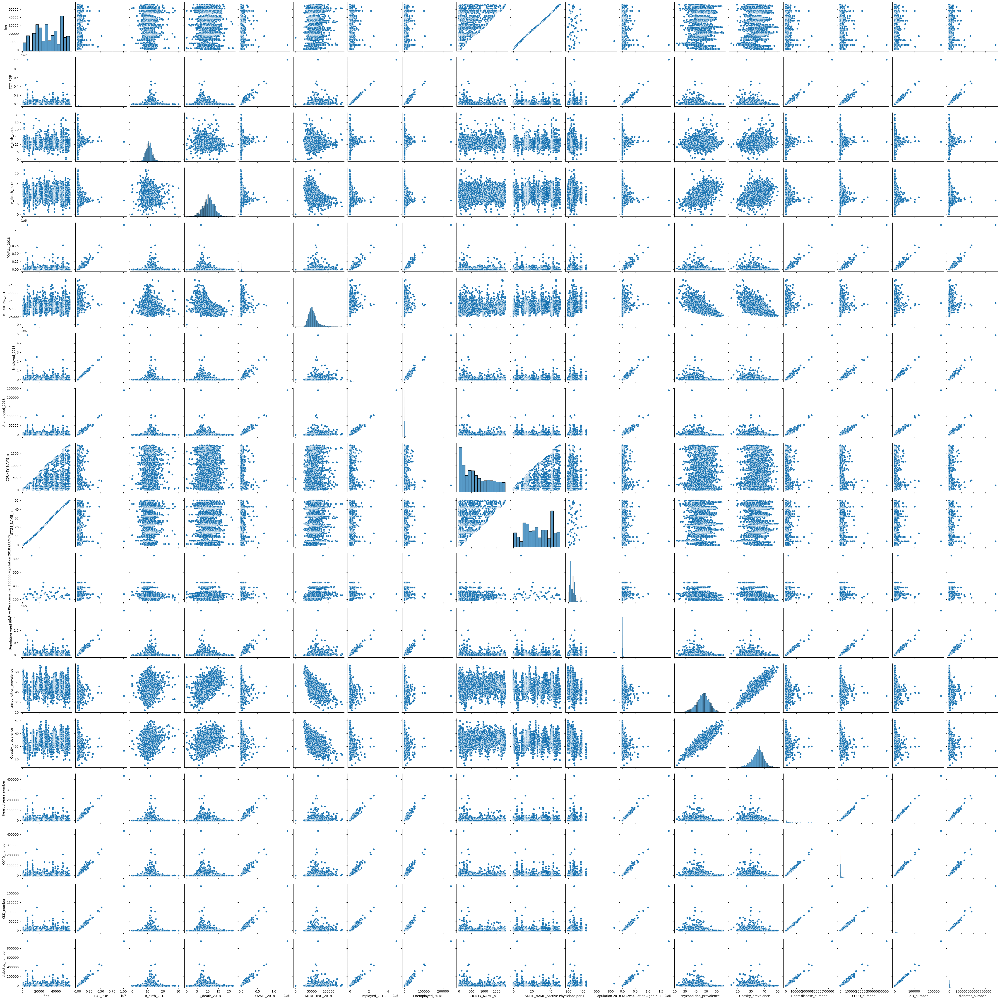

In [ ]:

sns.pairplot(clean_data[["fips", "TOT_POP", "R_birth_2018", "R_death_2018", "POVALL_2018", "MEDHHINC_2018", "Employed_2018", "Unemployed_2018", "COUNTY_NAME_n", "STATE_NAME_n", "Active Physicians per 100000 Population 2018 (AAMC)", "Population Aged 60+", "anycondition_prevalence", "Obesity_prevalence", "Heart disease_number", "COPD_number", "CKD_number", "diabetes_number"]])


# PASO 5: *Feature engineering*

- ANÁLISIS DE OUTLIERS: 

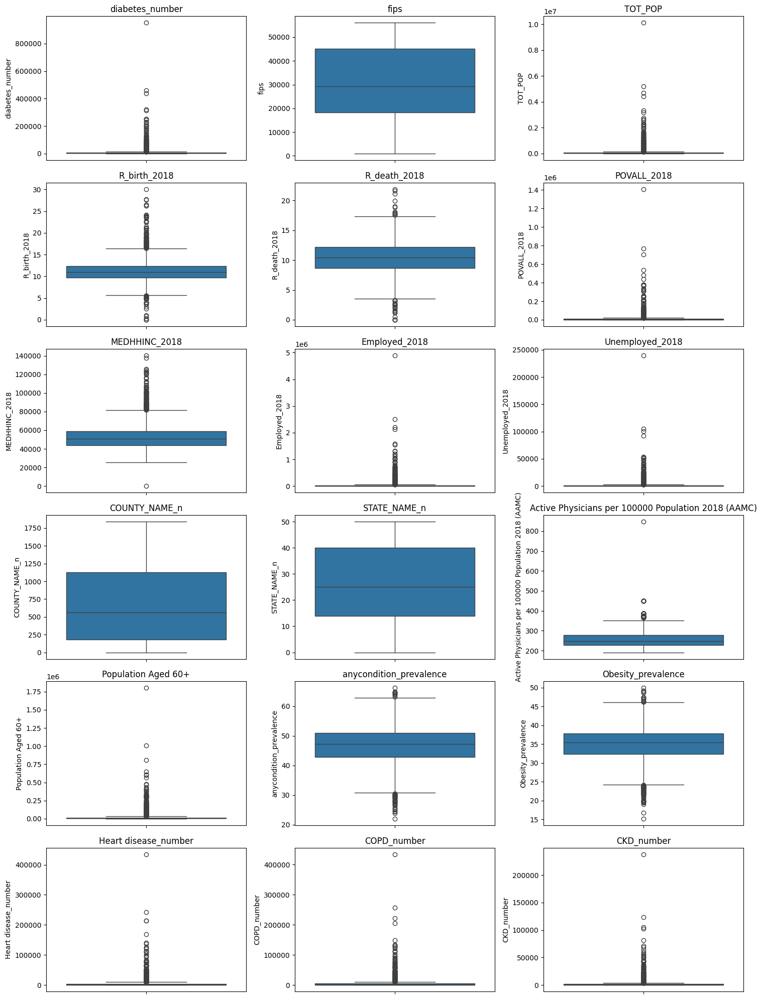

In [ ]:
variables = [
    "diabetes_number", "fips", "TOT_POP", "R_birth_2018", "R_death_2018", 
    "POVALL_2018", "MEDHHINC_2018", "Employed_2018", "Unemployed_2018", 
    "COUNTY_NAME_n", "STATE_NAME_n", "Active Physicians per 100000 Population 2018 (AAMC)", 
    "Population Aged 60+", "anycondition_prevalence", "Obesity_prevalence", 
    "Heart disease_number", "COPD_number", "CKD_number"
]

# Definir dimensiones (6 filas x 3 columnas)
fig, axes = plt.subplots(6, 3, figsize=(15, 20))  # Tamaño ajustado
axes = axes.flatten()  # Convertimos la matriz en una lista para fácil acceso

# Generar los boxplots
for i, var in enumerate(variables):
    sns.boxplot(ax=axes[i], data=clean_data, y=var)
    axes[i].set_title(var)  # Agregar título a cada gráfico

# Eliminar ejes vacíos si hay menos de 18 variables
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Ajustar el diseño para evitar solapamientos
plt.tight_layout()
plt.show()


se pueden observar multiples variables con outliers

In [ ]:
import json

# Generar copias del DataFrame
clean_data_con_outliers = clean_data.copy()
clean_data_sin_outliers = clean_data.copy()

def replace_outliers_from_column(column, df):
    """
    Reemplaza los valores outliers en la columna dada utilizando el método IQR.
    Retorna el DataFrame modificado y los límites de outliers.
    """
    column_stats = df[column].describe()
    column_iqr = column_stats["75%"] - column_stats["25%"]
    upper_limit = column_stats["75%"] + 1.5 * column_iqr
    lower_limit = column_stats["25%"] - 1.5 * column_iqr

    # Asegurar que el límite inferior no sea negativo (para datos como precios o población)
    if lower_limit < 0:
        lower_limit = 0

    # Reemplazar valores fuera de los límites
    df[column] = df[column].apply(lambda x: x if (x <= upper_limit) else upper_limit)
    df[column] = df[column].apply(lambda x: x if (x >= lower_limit) else lower_limit)

    return df.copy(), [lower_limit, upper_limit]

# Obtener todas las columnas numéricas del DataFrame
num_columns = clean_data.select_dtypes(include=["number"]).columns

# Diccionario para almacenar los límites de outliers
outliers_dict = {}

# Aplicar el reemplazo de outliers en cada columna numérica
for column in num_columns:
    clean_data_sin_outliers, limits_list = replace_outliers_from_column(column, clean_data_sin_outliers)
    outliers_dict[column] = limits_list

# Guardar el diccionario en un archivo JSON
with open("outliers_replacement.json", "w") as f:
    json.dump(outliers_dict, f, indent=4)

# Mostrar el diccionario con los límites de outliers
print(json.dumps(outliers_dict, indent=4))


{
    "fips": [
        0,
        85433.0
    ],
    "TOT_POP": [
        0,
        153337.625
    ],
    "0-9": [
        0,
        18321.75
    ],
    "0-9 y/o % of total pop": [
        7.0588377662499955,
        16.487640596250003
    ],
    "10-19": [
        0,
        19993.875
    ],
    "10-19 y/o % of total pop": [
        8.697336139999999,
        16.63644994
    ],
    "20-29": [
        0,
        20545.0
    ],
    "20-29 y/o % of total pop": [
        6.468544207500002,
        17.2104902675
    ],
    "30-39": [
        0,
        18936.5
    ],
    "30-39 y/o % of total pop": [
        7.7642376849999994,
        15.564463085000002
    ],
    "40-49": [
        0,
        18433.375
    ],
    "40-49 y/o % of total pop": [
        8.133868276249999,
        14.937412626250001
    ],
    "50-59": [
        0,
        20668.625
    ],
    "50-59 y/o % of total pop": [
        10.202730187500004,
        16.964945307499995
    ],
    "60-69": [
        0,
        1956

In [ ]:
clean_data_sin_outliers

,fips,TOT_POP,0-9,0-9 y/o % of total pop,10-19,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code,COUNTY_NAME_n,STATE_NAME_n
0,1001,55601.000,6787.00,12.206615,7637.000,13.735364,6878.0,12.370281,7089.0,12.749771,...,11.9,13.8,5462.0,3.1,2.9,3.3,1326.0,3,0,0
1,1003,153337.625,18321.75,11.355276,19993.875,12.344167,20545.0,10.814964,18936.5,11.564429,...,11.0,13.1,14916.5,3.2,3.0,3.5,3968.5,4,1,0
2,1005,24881.000,2732.00,10.980266,2960.000,11.896628,3268.0,13.134520,3201.0,12.865239,...,18.6,20.6,3870.0,4.5,4.2,4.8,887.0,6,2,0
3,1007,22400.000,2456.00,10.964286,2596.000,11.589286,3029.0,13.522321,3113.0,13.897321,...,13.2,14.9,2511.0,3.3,3.1,3.6,595.0,2,3,0
4,1009,57840.000,7095.00,12.266598,7570.000,13.087828,6742.0,11.656293,6884.0,11.901798,...,12.6,14.5,6017.0,3.4,3.2,3.7,1507.0,2,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3135,56037,43051.000,6104.00,14.178532,6326.000,14.694200,5359.0,12.448027,6577.0,15.277229,...,8.3,9.6,2834.0,2.6,2.4,2.8,821.0,5,1837,50
3136,56039,23081.000,2384.00,10.328842,2185.000,9.466661,2967.0,12.854729,4093.0,15.564463,...,6.5,8.0,1360.0,2.4,2.2,2.6,447.0,5,481,50
3137,56041,20299.000,3121.00,15.375142,3205.000,15.788955,2153.0,10.606434,2702.0,13.311001,...,9.5,11.2,1500.0,3.0,2.8,3.2,430.0,5,1838,50
3138,56043,7885.000,858.00,10.881420,1113.000,14.115409,715.0,9.067850,903.0,11.452124,...,10.3,12.1,686.0,3.4,3.2,3.7,207.0,6,1839,50


- ANÁLISIS DE VALORES FALTANTES:

In [ ]:
clean_data_con_outliers.isnull().sum().sort_values(ascending=False)

fips                      0
TOT_POP                   0
0-9                       0
0-9 y/o % of total pop    0
10-19                     0
                         ..
CKD_Upper 95% CI          0
CKD_number                0
Urban_rural_code          0
COUNTY_NAME_n             0
STATE_NAME_n              0
Length: 110, dtype: int64

In [ ]:
clean_data_sin_outliers.isnull().sum().sort_values(ascending=False)

fips                      0
TOT_POP                   0
0-9                       0
0-9 y/o % of total pop    0
10-19                     0
                         ..
CKD_Upper 95% CI          0
CKD_number                0
Urban_rural_code          0
COUNTY_NAME_n             0
STATE_NAME_n              0
Length: 110, dtype: int64

### ESCALADO DE VALORES *Feature scaling*

In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

# Crear carpeta si no existe
ruta_base = r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\data\processed\clean_data_xlsx"
os.makedirs(ruta_base, exist_ok=True)  # Crea la carpeta si no existe

# Seleccionar todas las variables numéricas excepto la target 'y_n'
vars_clean_data = clean_data_con_outliers.select_dtypes(include=["number"]).columns.tolist()
vars_clean_data.remove("diabetes_number")  # Eliminamos la variable objetivo

# Definir variables X (features) e y (target)
X_con_outliers = clean_data_con_outliers[vars_clean_data]
X_sin_outliers = clean_data_sin_outliers[vars_clean_data]
y = clean_data_con_outliers["diabetes_number"]

# Dividir los datos en train y test
X_train_con_outliers, X_test_con_outliers, y_train, y_test = train_test_split(
    X_con_outliers, y, test_size=0.2, random_state=42
)
X_train_sin_outliers, X_test_sin_outliers = train_test_split(
    X_sin_outliers, test_size=0.2, random_state=42
)

# Diccionario con los datasets
datasets = {
    "X_train_con_outliers": X_train_con_outliers,
    "X_train_sin_outliers": X_train_sin_outliers,
    "X_test_con_outliers": X_test_con_outliers,
    "X_test_sin_outliers": X_test_sin_outliers,
    "y_train": y_train,
    "y_test": y_test
}

# Guardar los archivos en Excel
for nombre, df in datasets.items():
    ruta_archivo = os.path.join(ruta_base, f"{nombre}.xlsx")
    df.to_excel(ruta_archivo, index=False)


### NORMALIZACIÓN

In [ ]:
from sklearn.preprocessing import StandardScaler

# NORMALIZACIÓN DEL DATAFRAME CON OUTLIERS Y GUARDARLO
normalizador_con_outliers = StandardScaler()
normalizador_con_outliers.fit(X_train_con_outliers)

with open(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\models\NORMALIZERS/normalizador_con_outliers.pkl", "wb") as file:
  pickle.dump(normalizador_con_outliers, file)

X_train_con_outliers_norm = normalizador_con_outliers.transform(X_train_con_outliers)
X_train_con_outliers_norm = pd.DataFrame(X_train_con_outliers_norm, index = X_train_con_outliers.index, columns = vars_clean_data)

X_test_con_outliers_norm = normalizador_con_outliers.transform(X_test_con_outliers)
X_test_con_outliers_norm = pd.DataFrame(X_test_con_outliers_norm, index = X_test_con_outliers.index, columns = vars_clean_data)

# GUARDAR LOS DATASETS
X_train_con_outliers_norm.to_excel(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\data\processed\clean_data_xlsx/X_train_con_outliers_norm.xlsx", index = False)
X_test_con_outliers_norm.to_excel(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\data\processed\clean_data_xlsx/X_test_con_outliers_norm.xlsx", index = False)

### NORMALIZAMOS EL DATAFRAME SIN OUTLIERS Y LO GUARDAMOS
normalizador_sin_outliers = StandardScaler()
normalizador_sin_outliers.fit(X_train_sin_outliers)

with open(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\models\NORMALIZERS/normalizador_sin_outliers.pkl", "wb") as file:
  pickle.dump(normalizador_sin_outliers, file)

X_train_sin_outliers_norm = normalizador_sin_outliers.transform(X_train_sin_outliers)
X_train_sin_outliers_norm = pd.DataFrame(X_train_sin_outliers_norm, index = X_train_sin_outliers.index, columns = vars_clean_data)

X_test_sin_outliers_norm = normalizador_sin_outliers.transform(X_test_sin_outliers)
X_test_sin_outliers_norm = pd.DataFrame(X_test_sin_outliers_norm, index = X_test_sin_outliers.index, columns = vars_clean_data)

# GUARDAR LOS DATASETS
X_train_sin_outliers_norm.to_excel(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\data\processed\clean_data_xlsx/X_train_sin_outliers_norm.xlsx", index = False)
X_test_sin_outliers_norm.to_excel(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\data\processed\clean_data_xlsx/X_test_sin_outliers_norm.xlsx", index = False)

X_train_con_outliers_norm.head()


,fips,TOT_POP,0-9,0-9 y/o % of total pop,10-19,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code,COUNTY_NAME_n,STATE_NAME_n
1292,-0.301633,-0.229763,-0.225393,0.102383,-0.231350,0.162374,-0.229775,-0.429454,-0.223780,-0.665485,...,0.244361,0.209312,0.314479,0.644725,0.576430,0.657452,-0.216950,0.910528,0.343882,-0.317280
2302,0.761573,-0.161280,-0.179851,-0.754597,-0.181109,-0.836073,-0.188375,-0.736296,-0.176225,-0.785934,...,0.021661,-0.060621,0.064137,0.109985,0.000382,0.161947,-0.135212,0.249092,1.314203,0.812126
761,-0.833037,-0.198764,-0.209983,-0.717144,-0.195009,0.464170,-0.168470,1.320194,-0.194740,-0.128551,...,-0.312388,-0.330555,-0.329256,-0.959495,-0.959698,-0.994232,-0.204982,-1.735217,-0.676341,-0.881983
2194,0.629287,-0.048115,-0.049041,0.120407,-0.029705,0.576280,-0.067671,0.094875,-0.062335,0.335452,...,-0.683554,-0.639050,-0.722650,-0.781249,-0.767682,-0.829064,-0.055748,-1.073780,1.214399,0.670950
1241,-0.308413,0.070012,0.073864,0.252809,0.080526,0.234535,0.038603,0.173362,0.025430,0.070962,...,-0.201038,-0.137745,-0.221967,-0.068262,0.000382,-0.168390,0.108446,-0.412344,-1.267775,-0.317280


### ESCALADO MIN-MAX

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# ESCALADO MIN-MAX EL DATAFRAME CON OUTLIERS Y LO GUARDAMOS
scaler_con_outliers = MinMaxScaler()
scaler_con_outliers.fit(X_train_con_outliers)

with open(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\models\SCALERS/scaler_con_outliers.pkl", "wb") as file:
  pickle.dump(scaler_con_outliers, file)

X_train_con_outliers_scal = scaler_con_outliers.transform(X_train_con_outliers)
X_train_con_outliers_scal = pd.DataFrame(X_train_con_outliers_scal, index = X_train_con_outliers.index, columns = vars_clean_data)

X_test_con_outliers_scal = scaler_con_outliers.transform(X_test_con_outliers)
X_test_con_outliers_scal = pd.DataFrame(X_test_con_outliers_scal, index = X_test_con_outliers.index, columns = vars_clean_data)

# GUARDAR LOS DATASETS
X_train_con_outliers_scal.to_excel(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\data\processed\clean_data_xlsx/X_train_con_outliers_scal.xlsx", index = False)
X_test_con_outliers_scal.to_excel(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\data\processed\clean_data_xlsx/X_test_con_outliers_scal.xlsx", index = False)

### ESCALAMOS EL DATAFRAME SIN OUTLIERS Y LO GUARDAMOS
scaler_sin_outliers = MinMaxScaler()
scaler_sin_outliers.fit(X_train_sin_outliers)

with open(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\models\SCALERS/scaler_sin_outliers.pkl", "wb") as file:
  pickle.dump(scaler_sin_outliers, file)

X_train_sin_outliers_scal = scaler_sin_outliers.transform(X_train_sin_outliers)
X_train_sin_outliers_scal = pd.DataFrame(X_train_sin_outliers_scal, index = X_train_sin_outliers.index, columns = vars_clean_data)

X_test_sin_outliers_scal = scaler_sin_outliers.transform(X_test_sin_outliers)
X_test_sin_outliers_scal = pd.DataFrame(X_test_sin_outliers_scal, index = X_test_sin_outliers.index, columns = vars_clean_data)

# GUARDAR LOS DATASETS
X_train_sin_outliers_scal.to_excel(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\data\processed\clean_data_xlsx/X_train_sin_outliers_scal.xlsx", index = False)
X_test_sin_outliers_scal.to_excel(r"C:\Users\mafer\OneDrive\Escritorio\Data Science\machine-learning-python-template--MFGS-Regularized-Linear-Models\data\processed\clean_data_xlsx/X_test_sin_outliers_scal.xlsx", index = False)

X_train_con_outliers_scal.head()

,fips,TOT_POP,0-9,0-9 y/o % of total pop,10-19,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,...,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code,COUNTY_NAME_n,STATE_NAME_n
1292,0.456468,0.002626,0.002666,0.484236,0.002795,0.558117,0.001877,0.316717,0.001876,0.280961,...,0.395833,0.381720,0.414141,0.441860,0.425,0.456522,0.003230,1.0,0.477693,0.44
2302,0.747057,0.005064,0.004363,0.411625,0.004641,0.481367,0.003299,0.289175,0.003549,0.268121,...,0.364583,0.344086,0.378788,0.372093,0.350,0.391304,0.006103,0.8,0.763330,0.76
761,0.311228,0.003730,0.003240,0.414798,0.004130,0.581316,0.003983,0.473765,0.002898,0.338200,...,0.317708,0.306452,0.323232,0.232558,0.225,0.239130,0.003651,0.2,0.177367,0.28
2194,0.710901,0.009094,0.009239,0.485763,0.010205,0.589934,0.007447,0.363781,0.007555,0.387664,...,0.265625,0.263441,0.267677,0.255814,0.250,0.260870,0.008895,0.4,0.733950,0.72
1241,0.454615,0.013300,0.013820,0.496981,0.014257,0.563664,0.011098,0.370826,0.010642,0.359468,...,0.333333,0.333333,0.338384,0.348837,0.350,0.347826,0.014666,0.6,0.003264,0.44
